# Technocolabs Softwares Internship Program in Data Science
### Name:- Shashikant Sawadh
### Project name:- Predicting Hit Songs Using Repeated Chorus

Import Required Python libraries

In [1]:
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt  
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# set seed for reproducibility
np.random.seed(0)

Load Dataset

In [2]:
dataset=pd.read_csv(r'C:\Users\sawad\Data Science course\Technocolabs software Task\PROJECT_Predicting Hit Songs Using\Final_data.csv')

In [3]:
dataset

,Artist,Title,Label,Path,choruspath,chroma_stft_kew_0,chroma_stft_min_0,chroma_stft_max_0,chroma_stft_std_0,chroma_stft_mean_0,...,tonnetz_mean_5,tonnetz_median_5,tonnetz_kurtosis_5,zero_crossing_rate_kew_0,zero_crossing_rate_min_0,zero_crossing_rate_max_0,zero_crossing_rate_std_0,zero_crossing_rate_mean_0,zero_crossing_rate_median_0,zero_crossing_rate_kurtosis_0
0,The Weeknd,Blinding Lights,1.0,Songs/The Weeknd - Blinding Lights (Official V...,Songs/RepeatedPopularChorus/The Weeknd - Blind...,0.091806,0.049545,1.0,0.306971,0.570429,...,0.007217,-0.000351,-0.410349,-0.604349,0.022585,0.102132,0.017701,0.072071,0.074626,0.012681
1,Olivia Rodrigo,Good 4 U,1.0,Songs/Olivia Rodrigo - good 4 u (Official Vide...,Songs/RepeatedPopularChorus/Olivia Rodrigo - g...,1.025965,0.007265,1.0,0.274179,0.350277,...,-0.011851,-0.010293,0.099909,-0.233246,0.057460,0.229705,0.035304,0.147578,0.157302,-0.281870
2,Olivia Rodrigo,Drivers License,1.0,Songs/Olivia Rodrigo - drivers license (Offici...,Songs/RepeatedPopularChorus/Olivia Rodrigo - d...,1.395750,0.000648,1.0,0.307888,0.236975,...,0.001545,-0.009260,0.360879,0.742759,0.023492,0.178957,0.032571,0.077563,0.066463,-0.180427
3,Lil Nas X,Montero (Call Me By Your Name),1.0,Songs/Lil Nas X - MONTERO (Call Me By Your Nam...,Songs/RepeatedPopularChorus/Lil Nas X - MONTER...,0.926616,0.003467,1.0,0.242382,0.301311,...,-0.014834,-0.023444,0.456362,0.524002,0.051111,0.277596,0.045581,0.147997,0.142472,-0.344706
4,BTS,Butter,1.0,Songs/BTS (방탄소년단) 'Butter' Official MV.mp3,Songs/RepeatedPopularChorus/BTS (방탄소년단) 'Butte...,0.311976,0.037900,1.0,0.336300,0.517165,...,0.005743,0.005232,-0.153372,2.700198,0.046848,0.235737,0.030815,0.097298,0.090204,7.939578
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
804,Gwen Stefani,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
805,Rihanna,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
806,Lil Wayne,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
807,Alicia Keys,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
dataset.head()

,Artist,Title,Label,Path,choruspath,chroma_stft_kew_0,chroma_stft_min_0,chroma_stft_max_0,chroma_stft_std_0,chroma_stft_mean_0,...,tonnetz_mean_5,tonnetz_median_5,tonnetz_kurtosis_5,zero_crossing_rate_kew_0,zero_crossing_rate_min_0,zero_crossing_rate_max_0,zero_crossing_rate_std_0,zero_crossing_rate_mean_0,zero_crossing_rate_median_0,zero_crossing_rate_kurtosis_0
0,The Weeknd,Blinding Lights,1.0,Songs/The Weeknd - Blinding Lights (Official V...,Songs/RepeatedPopularChorus/The Weeknd - Blind...,0.091806,0.049545,1.0,0.306971,0.570429,...,0.007217,-0.000351,-0.410349,-0.604349,0.022585,0.102132,0.017701,0.072071,0.074626,0.012681
1,Olivia Rodrigo,Good 4 U,1.0,Songs/Olivia Rodrigo - good 4 u (Official Vide...,Songs/RepeatedPopularChorus/Olivia Rodrigo - g...,1.025965,0.007265,1.0,0.274179,0.350277,...,-0.011851,-0.010293,0.099909,-0.233246,0.057460,0.229705,0.035304,0.147578,0.157302,-0.281870
2,Olivia Rodrigo,Drivers License,1.0,Songs/Olivia Rodrigo - drivers license (Offici...,Songs/RepeatedPopularChorus/Olivia Rodrigo - d...,1.395750,0.000648,1.0,0.307888,0.236975,...,0.001545,-0.009260,0.360879,0.742759,0.023492,0.178957,0.032571,0.077563,0.066463,-0.180427
3,Lil Nas X,Montero (Call Me By Your Name),1.0,Songs/Lil Nas X - MONTERO (Call Me By Your Nam...,Songs/RepeatedPopularChorus/Lil Nas X - MONTER...,0.926616,0.003467,1.0,0.242382,0.301311,...,-0.014834,-0.023444,0.456362,0.524002,0.051111,0.277596,0.045581,0.147997,0.142472,-0.344706
4,BTS,Butter,1.0,Songs/BTS (방탄소년단) 'Butter' Official MV.mp3,Songs/RepeatedPopularChorus/BTS (방탄소년단) 'Butte...,0.311976,0.037900,1.0,0.336300,0.517165,...,0.005743,0.005232,-0.153372,2.700198,0.046848,0.235737,0.030815,0.097298,0.090204,7.939578


In [5]:
dataset.tail()

,Artist,Title,Label,Path,choruspath,chroma_stft_kew_0,chroma_stft_min_0,chroma_stft_max_0,chroma_stft_std_0,chroma_stft_mean_0,...,tonnetz_mean_5,tonnetz_median_5,tonnetz_kurtosis_5,zero_crossing_rate_kew_0,zero_crossing_rate_min_0,zero_crossing_rate_max_0,zero_crossing_rate_std_0,zero_crossing_rate_mean_0,zero_crossing_rate_median_0,zero_crossing_rate_kurtosis_0
804,Gwen Stefani,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
805,Rihanna,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
806,Lil Wayne,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
807,Alicia Keys,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
808,Rascal Flatts,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
dataset.isnull()

,Artist,Title,Label,Path,choruspath,chroma_stft_kew_0,chroma_stft_min_0,chroma_stft_max_0,chroma_stft_std_0,chroma_stft_mean_0,...,tonnetz_mean_5,tonnetz_median_5,tonnetz_kurtosis_5,zero_crossing_rate_kew_0,zero_crossing_rate_min_0,zero_crossing_rate_max_0,zero_crossing_rate_std_0,zero_crossing_rate_mean_0,zero_crossing_rate_median_0,zero_crossing_rate_kurtosis_0
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
804,False,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
805,False,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
806,False,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
807,False,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True


In [7]:
dataset.dtypes

Artist                            object
Title                             object
Label                            float64
Path                              object
choruspath                        object
                                  ...   
zero_crossing_rate_max_0         float64
zero_crossing_rate_std_0         float64
zero_crossing_rate_mean_0        float64
zero_crossing_rate_median_0      float64
zero_crossing_rate_kurtosis_0    float64
Length: 523, dtype: object

Drop unnecessary columns

In [8]:
dataset = dataset.drop('Path', axis=1).drop('choruspath', axis=1)
dataset.head()

,Artist,Title,Label,chroma_stft_kew_0,chroma_stft_min_0,chroma_stft_max_0,chroma_stft_std_0,chroma_stft_mean_0,chroma_stft_median_0,chroma_stft_kurtosis_0,...,tonnetz_mean_5,tonnetz_median_5,tonnetz_kurtosis_5,zero_crossing_rate_kew_0,zero_crossing_rate_min_0,zero_crossing_rate_max_0,zero_crossing_rate_std_0,zero_crossing_rate_mean_0,zero_crossing_rate_median_0,zero_crossing_rate_kurtosis_0
0,The Weeknd,Blinding Lights,1.0,0.091806,0.049545,1.0,0.306971,0.570429,0.556123,-1.389693,...,0.007217,-0.000351,-0.410349,-0.604349,0.022585,0.102132,0.017701,0.072071,0.074626,0.012681
1,Olivia Rodrigo,Good 4 U,1.0,1.025965,0.007265,1.0,0.274179,0.350277,0.265414,0.140231,...,-0.011851,-0.010293,0.099909,-0.233246,0.057460,0.229705,0.035304,0.147578,0.157302,-0.281870
2,Olivia Rodrigo,Drivers License,1.0,1.395750,0.000648,1.0,0.307888,0.236975,0.087020,0.739644,...,0.001545,-0.009260,0.360879,0.742759,0.023492,0.178957,0.032571,0.077563,0.066463,-0.180427
3,Lil Nas X,Montero (Call Me By Your Name),1.0,0.926616,0.003467,1.0,0.242382,0.301311,0.262466,0.285644,...,-0.014834,-0.023444,0.456362,0.524002,0.051111,0.277596,0.045581,0.147997,0.142472,-0.344706
4,BTS,Butter,1.0,0.311976,0.037900,1.0,0.336300,0.517165,0.438171,-1.429111,...,0.005743,0.005232,-0.153372,2.700198,0.046848,0.235737,0.030815,0.097298,0.090204,7.939578


Data Preprocessing

In [9]:
dataset.Label.unique()         #Changing Data Types

array([ 1.,  0., nan])

In [10]:
dataset['Label'] = dataset['Label'].astype("category")
dataset['Label'].dtypes

CategoricalDtype(categories=[0.0, 1.0], ordered=False)

### PLOTTING SOME PAIR PLOTS

## Figure 1. Pair plot of the median value of all major audio features

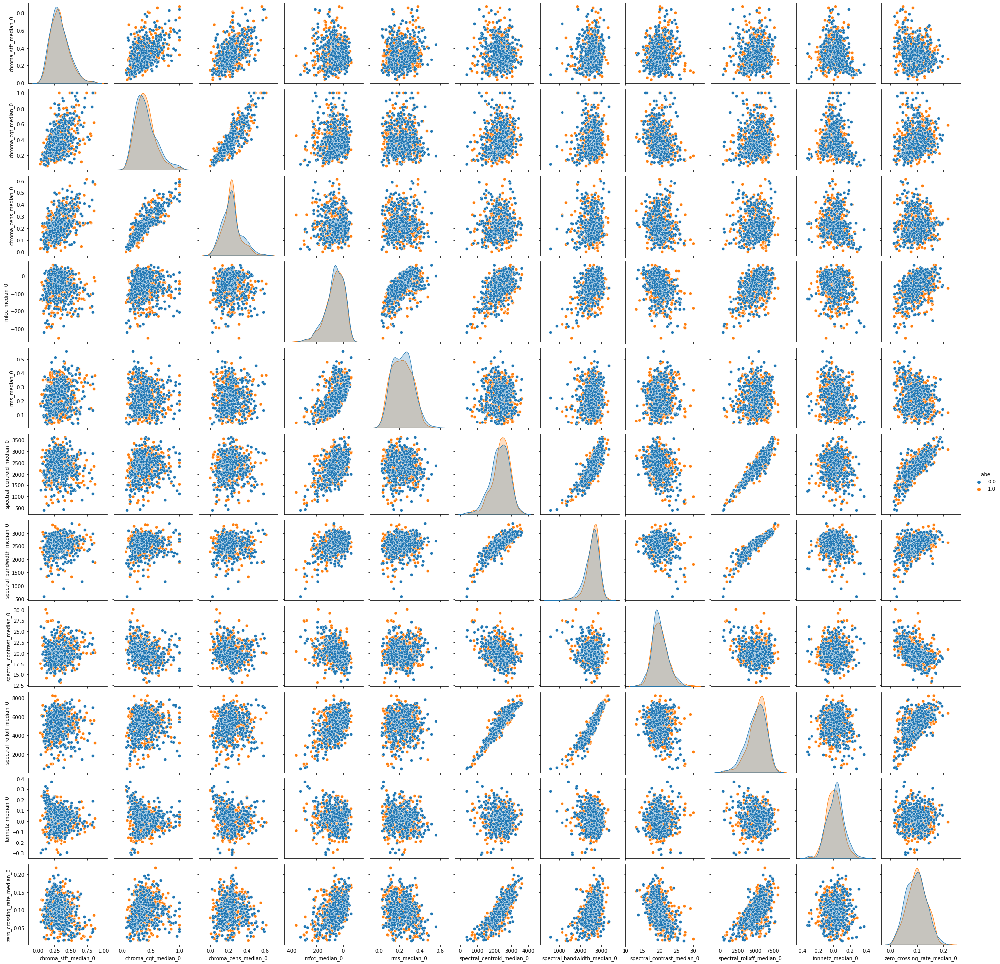

In [11]:
columns = dataset.columns
median_columns = ['Label']
for column in columns:
    if column .count('median_0') > 0:
        median_columns.append(column)

sns.pairplot(dataset[median_columns], hue='Label')

## Figure 2. Pair plot of the min value of all major audio features

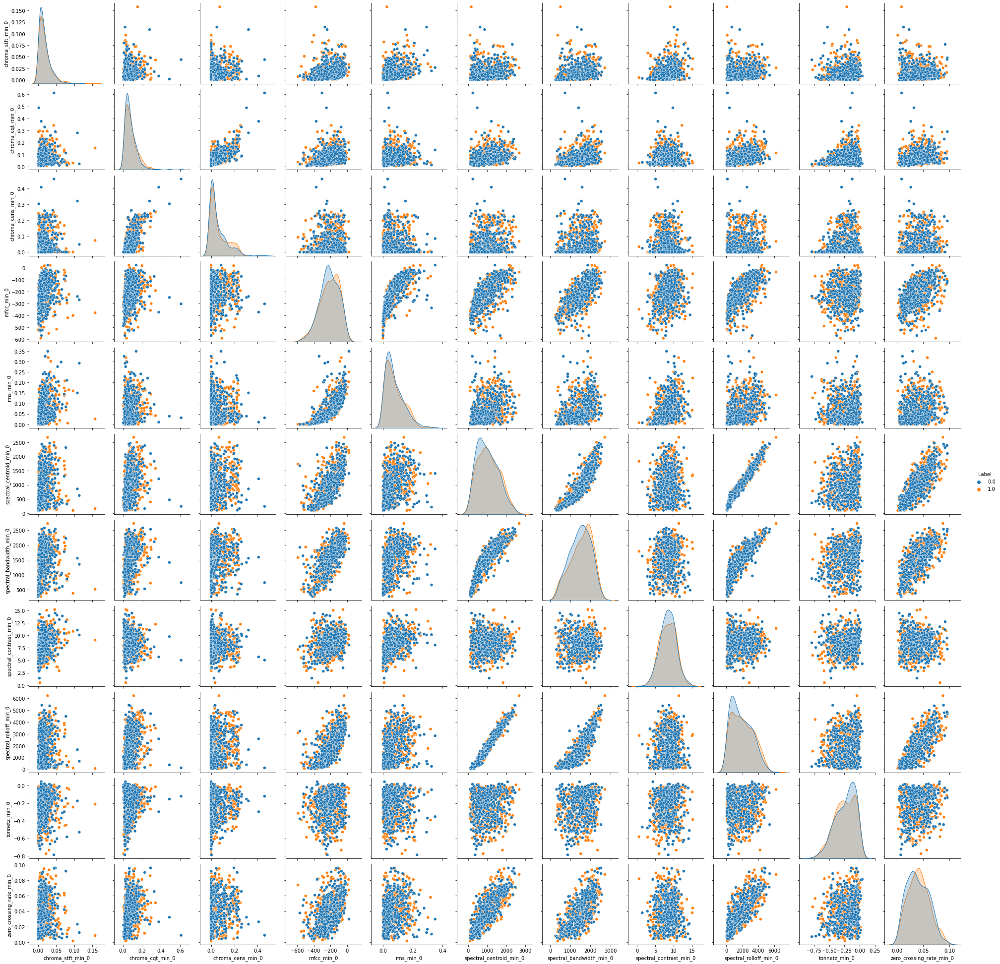

In [12]:
columns = dataset.columns
min_columns = ['Label']
for column in columns:
    if column .count('min_0') > 0:
        min_columns.append(column)

sns.pairplot(dataset[min_columns], hue='Label')

## Figure 3. Pair plot of the max value of all major audio features

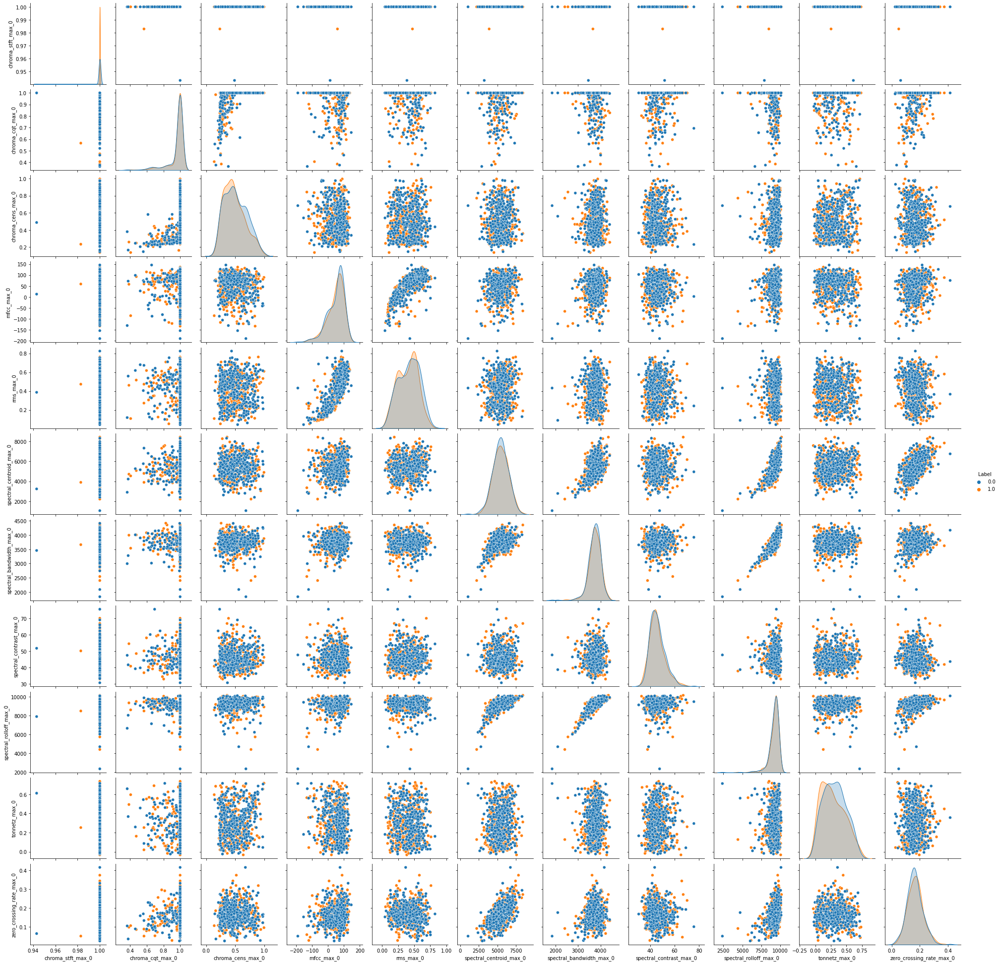

In [13]:
columns = dataset.columns
max_columns = ['Label']
for column in columns:
    if column .count('max_0') > 0:
        max_columns.append(column)

sns.pairplot(dataset[max_columns], hue='Label')

## Figure 4. Pair plot of the std value of all major audio features

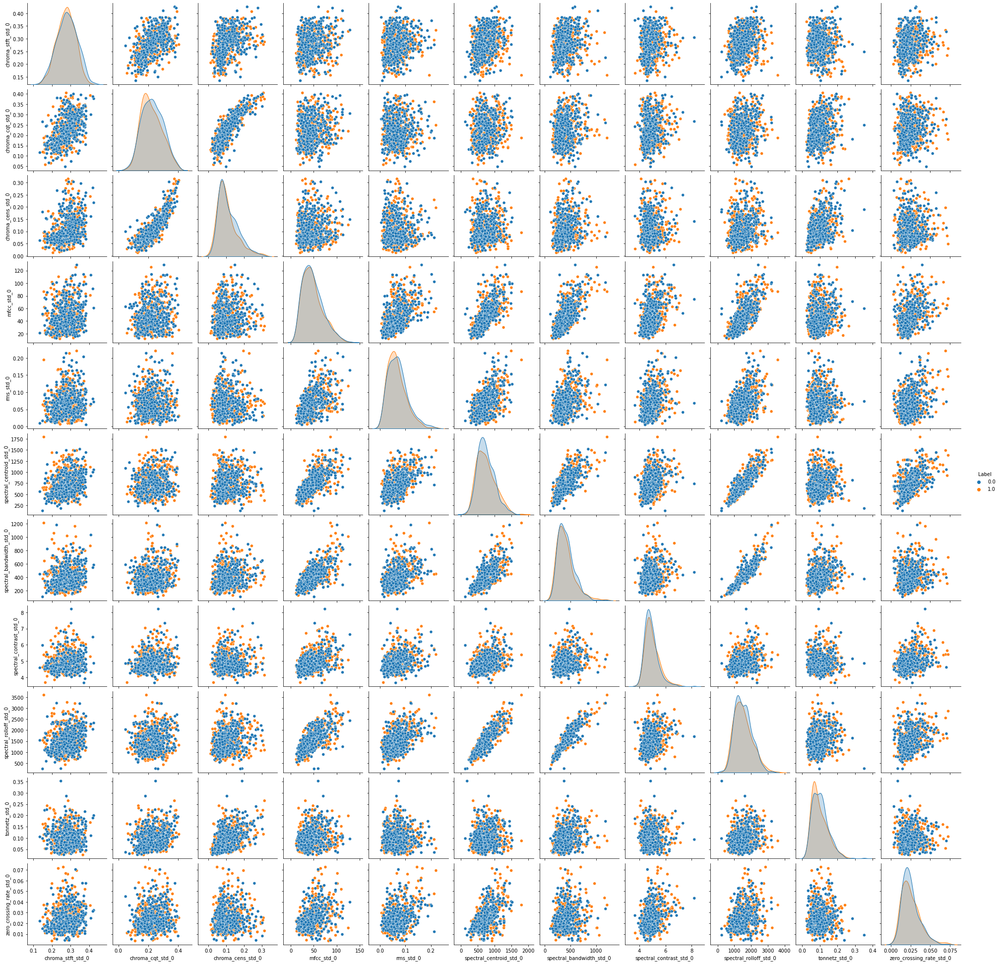

In [14]:
columns = dataset.columns
std_columns = ['Label']
for column in columns:
    if column .count('std_0') > 0:
        std_columns.append(column)

sns.pairplot(dataset[std_columns], hue='Label')

## Figure 5. Pair plot of the mean value of all major audio features

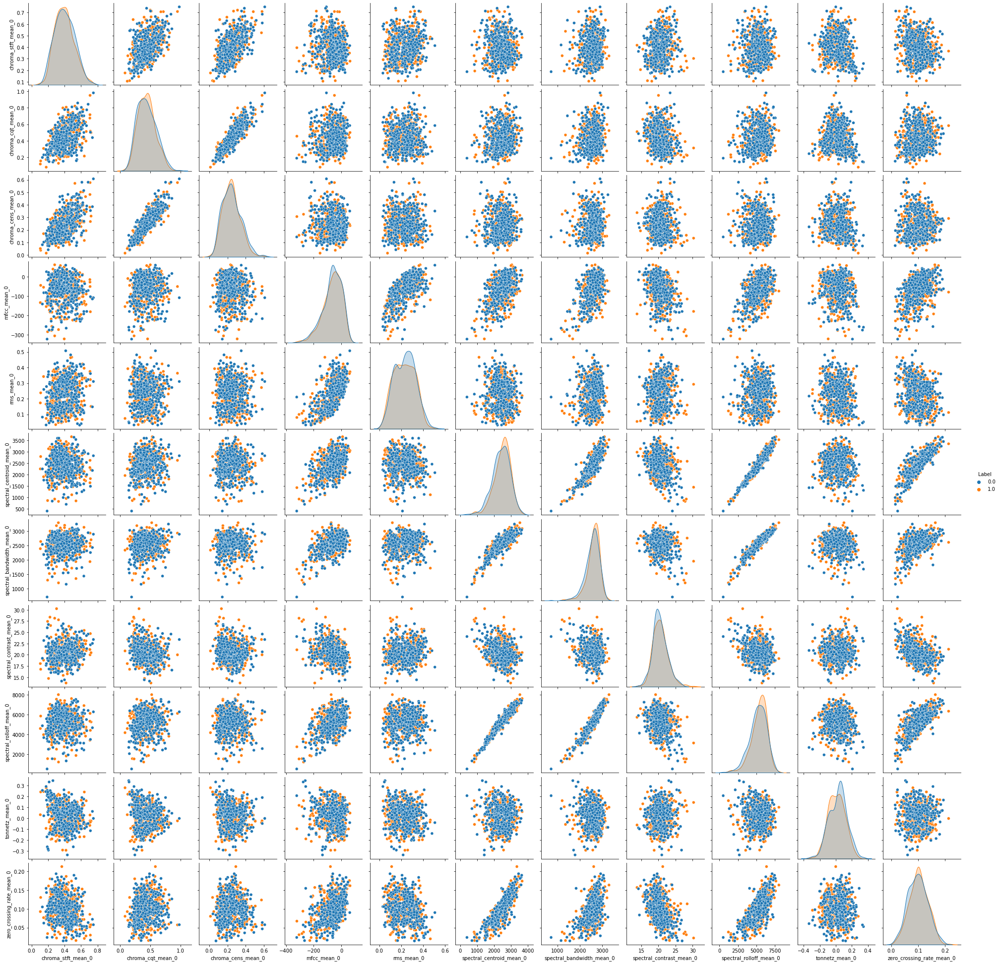

In [15]:
columns =dataset.columns
mean_columns = ['Label']
for column in columns:
    if column .count('mean_0') > 0:
        mean_columns.append(column)

sns.pairplot(dataset[mean_columns], hue='Label')

In [16]:
dataset= dataset.dropna()
dataset= dataset.reset_index()

In [17]:
dataset.head()

,index,Artist,Title,Label,chroma_stft_kew_0,chroma_stft_min_0,chroma_stft_max_0,chroma_stft_std_0,chroma_stft_mean_0,chroma_stft_median_0,...,tonnetz_mean_5,tonnetz_median_5,tonnetz_kurtosis_5,zero_crossing_rate_kew_0,zero_crossing_rate_min_0,zero_crossing_rate_max_0,zero_crossing_rate_std_0,zero_crossing_rate_mean_0,zero_crossing_rate_median_0,zero_crossing_rate_kurtosis_0
0,0,The Weeknd,Blinding Lights,1.0,0.091806,0.049545,1.0,0.306971,0.570429,0.556123,...,0.007217,-0.000351,-0.410349,-0.604349,0.022585,0.102132,0.017701,0.072071,0.074626,0.012681
1,1,Olivia Rodrigo,Good 4 U,1.0,1.025965,0.007265,1.0,0.274179,0.350277,0.265414,...,-0.011851,-0.010293,0.099909,-0.233246,0.057460,0.229705,0.035304,0.147578,0.157302,-0.281870
2,2,Olivia Rodrigo,Drivers License,1.0,1.395750,0.000648,1.0,0.307888,0.236975,0.087020,...,0.001545,-0.009260,0.360879,0.742759,0.023492,0.178957,0.032571,0.077563,0.066463,-0.180427
3,3,Lil Nas X,Montero (Call Me By Your Name),1.0,0.926616,0.003467,1.0,0.242382,0.301311,0.262466,...,-0.014834,-0.023444,0.456362,0.524002,0.051111,0.277596,0.045581,0.147997,0.142472,-0.344706
4,4,BTS,Butter,1.0,0.311976,0.037900,1.0,0.336300,0.517165,0.438171,...,0.005743,0.005232,-0.153372,2.700198,0.046848,0.235737,0.030815,0.097298,0.090204,7.939578


# PRINCIPAL COMPONENT ANALYSIS

In [18]:
from pca import pca

[pca] >Processing dataframe..
[pca] >Normalizing input data per feature (zero mean and unit variance)..
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [519] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [171] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [519] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[171]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]


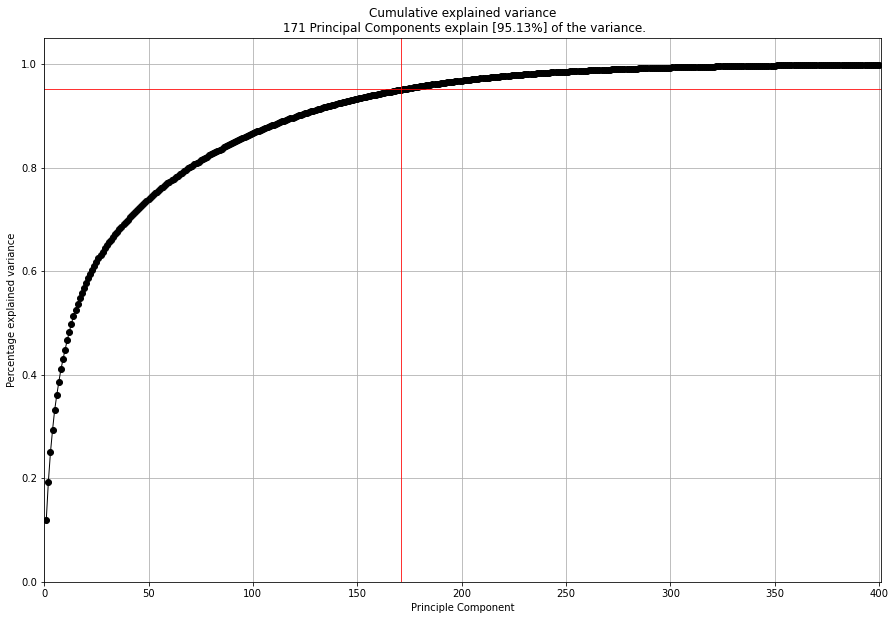

[pca] >Plot PC1 vs PC2 with loadings.


<Figure size 432x288 with 0 Axes>

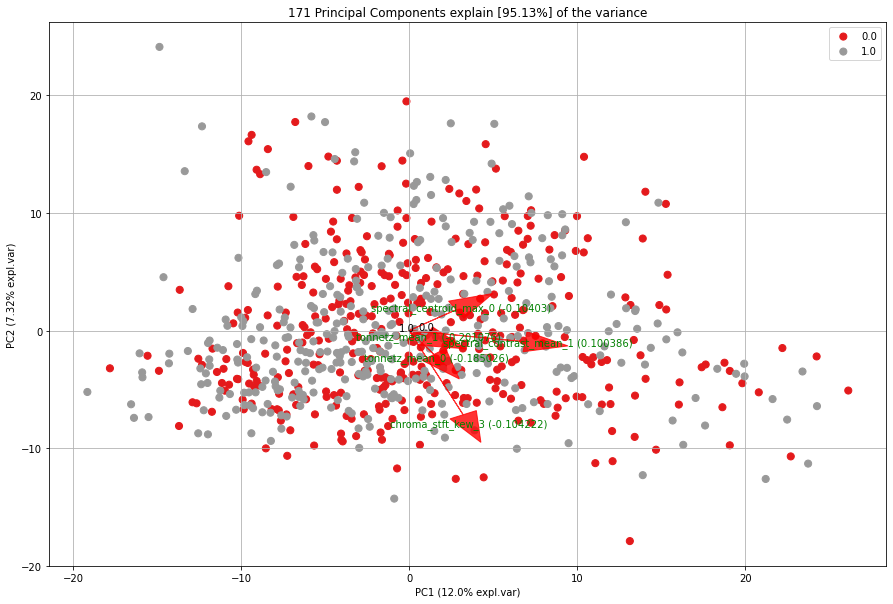

In [19]:
from pca import pca

X = dataset.drop('Artist', axis=1).drop('Title',axis=1).drop('index',axis=1)

# Initialize to reduce the data up to the nubmer of componentes that explains 95% of the variance.
model = pca(normalize=True)

# Fit transform
out = model.fit_transform(X)

# Plot explained variance
fig, ax = model.plot(n_components=400)

# Make biplot with the number of features
fig, ax = model.biplot(y=dataset['Label'], n_feat=5)

# Find best feature which we will use & these features which reach variance to 95%

In [20]:
# print(out['topfeat'])

df = pd.DataFrame(out['topfeat'])
best_features = df[df['type']=='best']
best_features

,PC,feature,loading,type
0,PC1,spectral_contrast_mean_1,0.100386,best
1,PC2,chroma_stft_kew_3,-0.104222,best
2,PC3,spectral_centroid_max_0,-0.104030,best
3,PC4,tonnetz_mean_0,-0.185026,best
4,PC5,tonnetz_mean_1,-0.201076,best
...,...,...,...,...
166,PC167,mfcc_max_5,-0.141796,best
167,PC168,chroma_stft_min_0,0.186942,best
168,PC169,spectral_contrast_min_3,-0.183955,best
169,PC170,chroma_cens_kew_11,-0.169059,best


MODEL BUILDING

Take X and y variables to training the model

In [21]:
columns = list(df['feature'][df['type']=='best'])
X = dataset[columns]
y = dataset['Label']

### Split the into X_train, X_test, y_train, y_test with test_size=0.2 and train_size=0.8

In [22]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2022)

In [23]:
import warnings
warnings.filterwarnings('ignore')
# from mlxtend.evaluate import bias_variance_decomp
from sklearn.metrics import f1_score, precision_score, recall_score, plot_confusion_matrix

dic = []

def metrics(name, model, X_train, y_train, X_test, y_test, y_pred):
    dic.append({
        'name': name,
        'train acc': model.score(X_train, y_train),
        'test acc': model.score(X_test, y_test),

        'f1 train acc': f1_score(y_train, model.predict(X_train)),
        'f1 test acc': f1_score(y_test, y_pred),

        'precision train acc': precision_score(y_train, model.predict(X_train)),
        'precision test acc': precision_score(y_test, y_pred),

        'recall train acc': recall_score(y_train, model.predict(X_train)),
        'recall test acc': recall_score(y_test, y_pred)
    })

def training(model, X_train, y_train, X_test, y_test, name):
    clf = model.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    # mse, bias, var = bias_variance_decomp(model, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', num_rounds=200, random_seed=random)

    metrics(name, clf, X_train, y_train, X_test, y_test, y_pred)

    return clf

# Build ML models which are

SVC(kernel='linear') (linearSVC_model) 

SVC(kernel='poly') (polySVC_model)

SVC(kernel='rbf') (rbfSVC_model)

LogisticRegression (log_model)

RandomForestClassifier (rfc_model)

In [24]:
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [25]:
log_model = training(LogisticRegression(max_iter=1000), X_train, y_train, X_test, y_test, 'LR')
linearSVC_model = training(SVC(kernel='linear'), X_train, y_train, X_test, y_test, 'Linear SVM')
polySVC_model = training(SVC(kernel='poly'), X_train, y_train, X_test, y_test, 'Poly SVM')
rbfSVC_model = training(SVC(kernel='rbf'), X_train, y_train, X_test, y_test, 'Rbf SVM')
rfc_model = training(RandomForestClassifier(), X_train, y_train, X_test, y_test, 'RFC')

### Convert metrixs into DataFrame

In [26]:
df = pd.DataFrame(dic)
df

,name,train acc,test acc,f1 train acc,f1 test acc,precision train acc,precision test acc,recall train acc,recall test acc
0,LR,1.000000,0.993377,1.000000,0.992908,1.000000,1.000000,1.000000,0.985915
1,Linear SVM,0.996667,0.980132,0.996622,0.979021,0.993266,0.972222,1.000000,0.985915
2,Poly SVM,0.511667,0.549669,0.300716,0.358491,0.508065,0.542857,0.213559,0.267606
3,Rbf SVM,0.505000,0.523179,0.139130,0.121951,0.480000,0.454545,0.081356,0.070423
4,RFC,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## See different between train acc, test acc in train and validation.

<AxesSubplot:xlabel='name'>

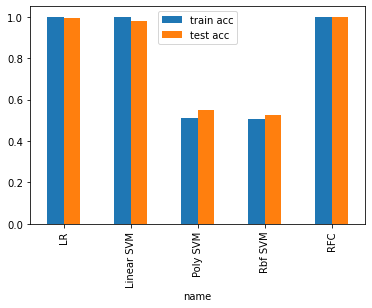

In [27]:
df.plot(x = 'name', y = ['train acc', 'test acc'], kind = 'bar')

## See different between f1 train acc, f1 test acc in train and validation.

<AxesSubplot:xlabel='name'>

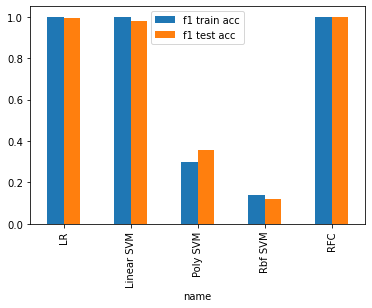

In [28]:
df.plot(x = 'name', y = ['f1 train acc', 'f1 test acc'], kind = 'bar')

## See different between precision train acc, precision test acc in train and validation.

<AxesSubplot:xlabel='name'>

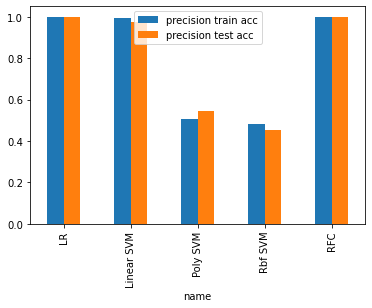

In [29]:
df.plot(x = 'name', y = ['precision train acc', 'precision test acc'], kind = 'bar')

## See different between recall train acc, recall test acc in train and validation.

<AxesSubplot:xlabel='name'>

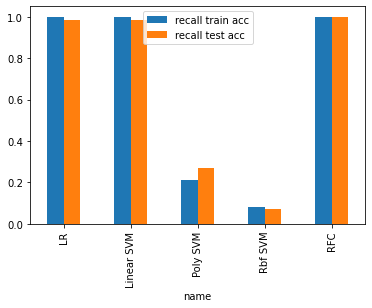

In [30]:
df.plot(x = 'name', y = ['recall train acc', 'recall test acc'], kind = 'bar')

# Save all models

In [33]:
import pickle
pickle.dump(log_model, open('log_model.pkl', 'wb'))
pickle.dump(linearSVC_model, open('linearSVC_model.pkl', 'wb'))
pickle.dump(polySVC_model, open('polySVC_model.pkl', 'wb'))
pickle.dump(rbfSVC_model, open('rbfSVC_model.pkl', 'wb'))
pickle.dump(rfc_model, open('rfc_model.pkl', 'wb'))